**Hourly Indian Air Quality Analysis and Prediction using Machine Learning & Deep Learning Techniques**

Air pollution in India is a significant issue and has been linked to numerous health problems, including respiratory issues and heart disease. 

The major sources of air pollution in India include vehicle emissions, industrial emissions, and burning of biomass. 

The government of India has implemented various measures to address the problem, such as implementing stricter emissions standards and promoting the use of renewable energy sources. 

However, more needs to be done to effectively combat the problem of air pollution in India.

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
import plotly.express as px

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_csv('/content/air-quality-india.csv')

In [ ]:
df.head()

,Timestamp,Year,Month,Day,Hour,PM2.5
0,07-11-2017 12:00,2017,11,7,12,64.51
1,07-11-2017 13:00,2017,11,7,13,69.95
2,07-11-2017 14:00,2017,11,7,14,92.79
3,07-11-2017 15:00,2017,11,7,15,109.66
4,07-11-2017 16:00,2017,11,7,16,116.50


In [ ]:
df.tail()

,Timestamp,Year,Month,Day,Hour,PM2.5
36187,04-06-2022 11:00,2022,6,4,11,35.89
36188,04-06-2022 12:00,2022,6,4,12,33.83
36189,04-06-2022 13:00,2022,6,4,13,33.05
36190,04-06-2022 14:00,2022,6,4,14,35.29
36191,04-06-2022 15:00,2022,6,4,15,40.67


In [ ]:
df.shape

(36192, 6)

In [ ]:
df.columns

Index(['Timestamp', 'Year', 'Month', 'Day', 'Hour', 'PM2.5'], dtype='object')

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.isnull().sum()

Timestamp    0
Year         0
Month        0
Day          0
Hour         0
PM2.5        0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36192 entries, 0 to 36191
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Timestamp  36192 non-null  object 
 1   Year       36192 non-null  int64  
 2   Month      36192 non-null  int64  
 3   Day        36192 non-null  int64  
 4   Hour       36192 non-null  int64  
 5   PM2.5      36192 non-null  float64
dtypes: float64(1), int64(4), object(1)
memory usage: 1.7+ MB


In [ ]:
df.describe()

,Year,Month,Day,Hour,PM2.5
count,36192.000000,36192.000000,36192.000000,36192.000000,36192.000000
mean,2019.682278,6.331841,15.716401,11.477840,49.308429
std,1.345011,3.593321,8.859769,6.925088,24.863511
min,2017.000000,1.000000,1.000000,0.000000,7.020000
25%,2019.000000,3.000000,8.000000,5.000000,28.080000
50%,2020.000000,6.000000,16.000000,11.000000,45.730000
75%,2021.000000,10.000000,23.000000,17.000000,64.520000
max,2022.000000,12.000000,31.000000,23.000000,245.630000


In [ ]:
df.nunique()

Timestamp    36192
Year             6
Month           12
Day             31
Hour            24
PM2.5         9202
dtype: int64

In [ ]:
df['Year'].unique()

array([2017, 2018, 2019, 2020, 2021, 2022])

In [ ]:
df['Year'].value_counts()

2020    8356
2021    8283
2019    7685
2018    7537
2022    3194
2017    1137
Name: Year, dtype: int64

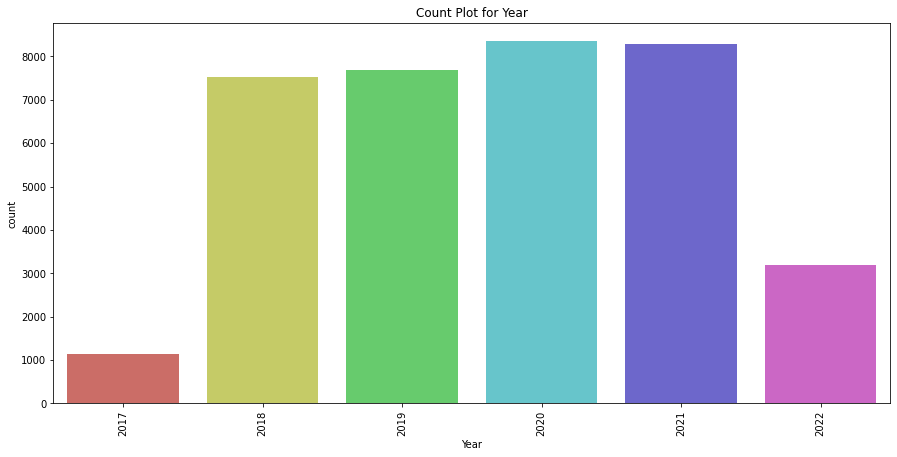

In [ ]:
plt.figure(figsize=[15,7],)
plt.title('Count Plot for Year')
sns.countplot(x = 'Year', data = df, palette = 'hls')
plt.xticks(rotation = 90)
plt.show()

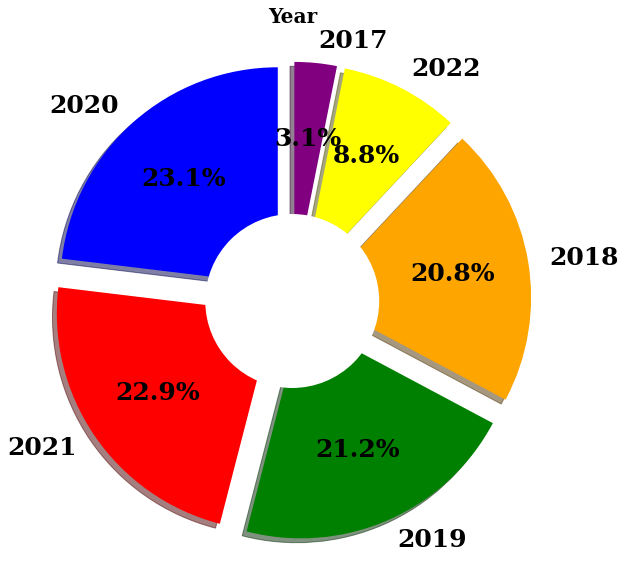

In [ ]:
year_data = df['Year'].value_counts()

explode = (0.1, 0.1, 0.1, 0.1, 0.1, 0.1)
plt.figure(figsize=(14, 10))
patches, texts, pcts = plt.pie(year_data,
                               labels = year_data.index,
                               colors = ['blue', 'red', 'green', 'orange',
                                        'yellow', 'purple'],
                               pctdistance = 0.65,
                               shadow = True,
                               startangle = 90,
                               explode = explode,
                               autopct = '%1.1f%%',
                               textprops={ 'fontsize': 25,
                                           'color': 'black',
                                           'weight': 'bold',
                                           'family': 'serif' })
plt.setp(pcts, color='black')

hfont = {'fontname':'serif', 'weight': 'bold'}
plt.title('Year', size=20, **hfont)

centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.show()

In [ ]:
df_new = df.copy()

In [ ]:
df_new['Timestamp']=pd.to_datetime(df_new['Timestamp'])

In [ ]:
df_new = df_new.set_index('Timestamp')

In [ ]:
df_new.head()

,Year,Month,Day,Hour,PM2.5
Timestamp,,,,,
2017-07-11 12:00:00,2017,11,7,12,64.51
2017-07-11 13:00:00,2017,11,7,13,69.95
2017-07-11 14:00:00,2017,11,7,14,92.79
2017-07-11 15:00:00,2017,11,7,15,109.66
2017-07-11 16:00:00,2017,11,7,16,116.50


In [ ]:
df_new.tail()

,Year,Month,Day,Hour,PM2.5
Timestamp,,,,,
2022-04-06 11:00:00,2022,6,4,11,35.89
2022-04-06 12:00:00,2022,6,4,12,33.83
2022-04-06 13:00:00,2022,6,4,13,33.05
2022-04-06 14:00:00,2022,6,4,14,35.29
2022-04-06 15:00:00,2022,6,4,15,40.67


In [ ]:
df1 = df_new[df_new['Year'] == 2017]
df2 = df_new[df_new['Year'] == 2018]
df3 = df_new[df_new['Year'] == 2019]
df4 = df_new[df_new['Year'] == 2020]
df5 = df_new[df_new['Year'] == 2021]
df6 = df_new[df_new['Year'] == 2022]

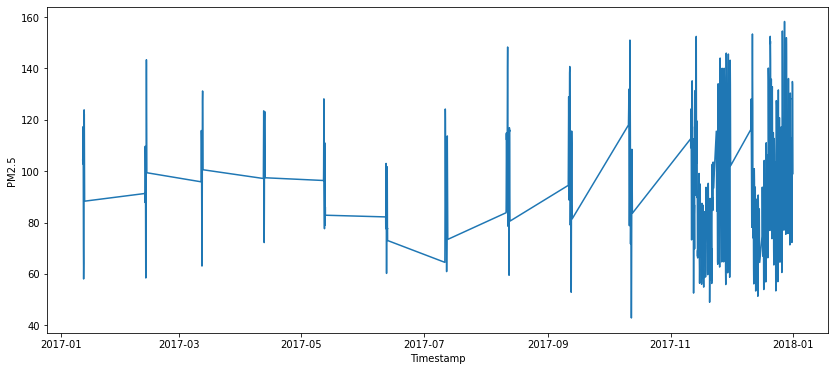

In [ ]:
plt.figure(figsize = (14,6))
sns.lineplot(x=df1.index, y="PM2.5", data=df1)
plt.show()

In [ ]:
fig = px.line(df1, x=df1.index, y="PM2.5", title='Time Series Analysis - 2017')
fig.show()

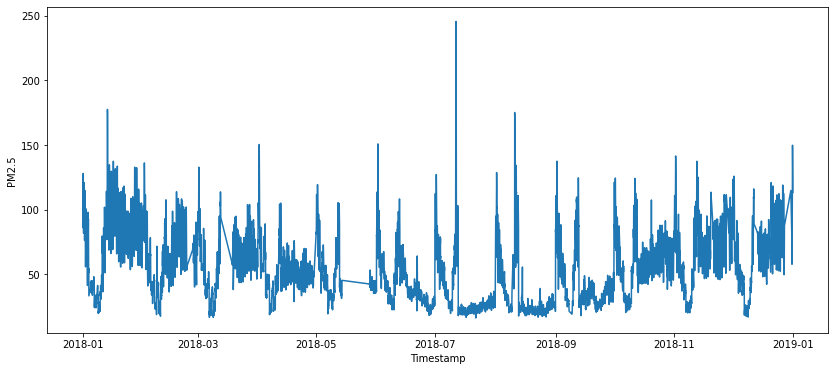

In [ ]:
plt.figure(figsize = (14,6))
sns.lineplot(x=df2.index, y="PM2.5", data=df2)
plt.show()

In [ ]:
fig = px.line(df2, x=df2.index, y="PM2.5", title='Time Series Analysis - 2018')
fig.show()

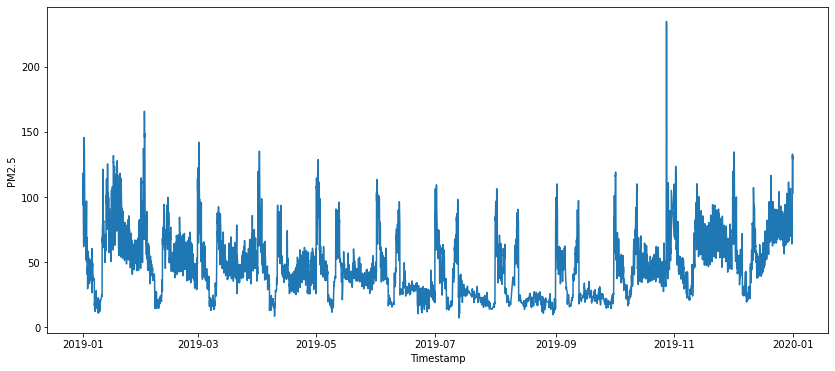

In [ ]:
plt.figure(figsize = (14,6))
sns.lineplot(x=df3.index, y="PM2.5", data=df3)
plt.show()

In [ ]:
fig = px.line(df3, x=df3.index, y="PM2.5", title='Time Series Analysis - 2019')
fig.show()

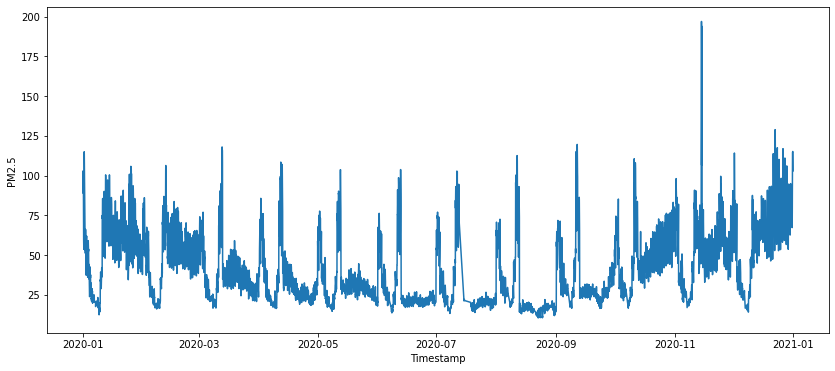

In [ ]:
plt.figure(figsize = (14,6))
sns.lineplot(x=df4.index, y="PM2.5", data=df4)
plt.show()

In [ ]:
fig = px.line(df4, x=df4.index, y="PM2.5", title='Time Series Analysis - 2020')
fig.show()

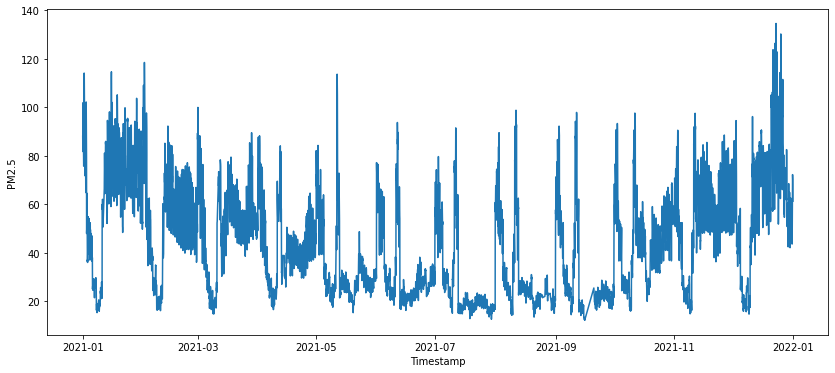

In [ ]:
plt.figure(figsize = (14,6))
sns.lineplot(x=df5.index, y="PM2.5", data=df5)
plt.show()

In [ ]:
fig = px.line(df5, x=df5.index, y="PM2.5", title='Time Series Analysis - 2021')
fig.show()

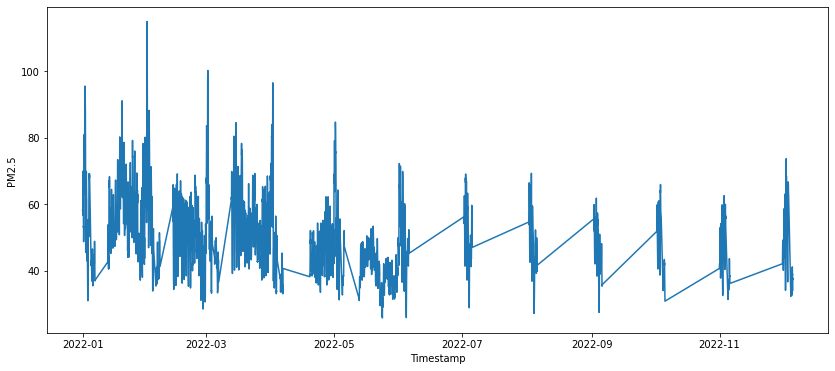

In [ ]:
plt.figure(figsize = (14,6))
sns.lineplot(x=df6.index, y="PM2.5", data=df6)
plt.show()

In [ ]:
fig = px.line(df6, x=df6.index, y="PM2.5", title='Time Series Analysis - 2022')
fig.show()

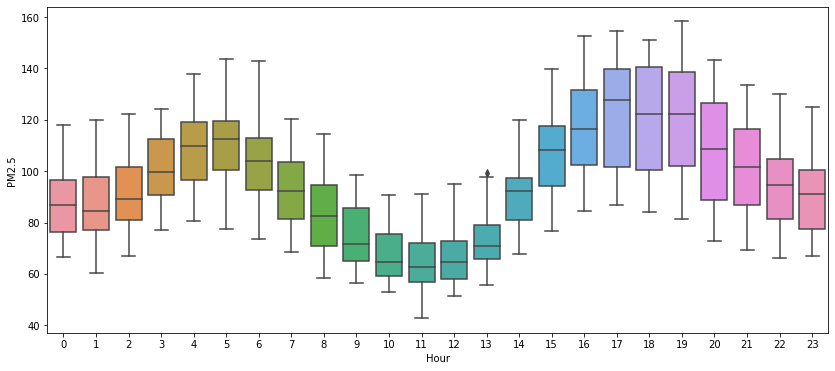

In [ ]:
plt.figure(figsize = (14,6))
sns.boxplot(x = 'Hour', y = df1['PM2.5'], data=df1)
plt.show()

In [ ]:
fig = px.box(df1, x="Hour", y=df1['PM2.5'])
fig.show()

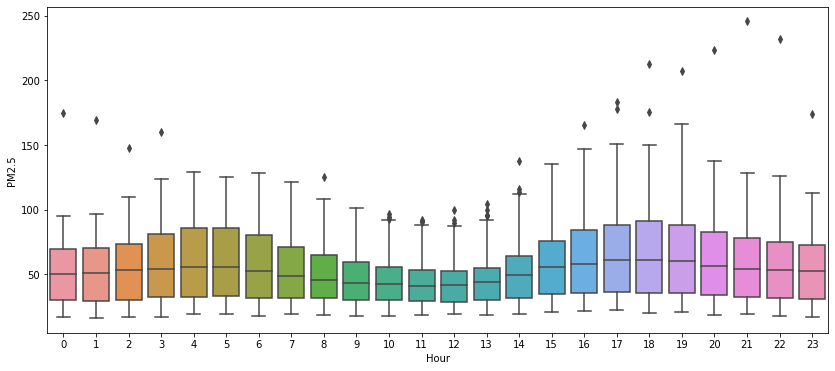

In [ ]:
plt.figure(figsize = (14,6))
sns.boxplot(x = 'Hour', y = df2['PM2.5'], data=df2)
plt.show()

In [ ]:
fig = px.box(df2, x="Hour", y=df2['PM2.5'])
fig.show()

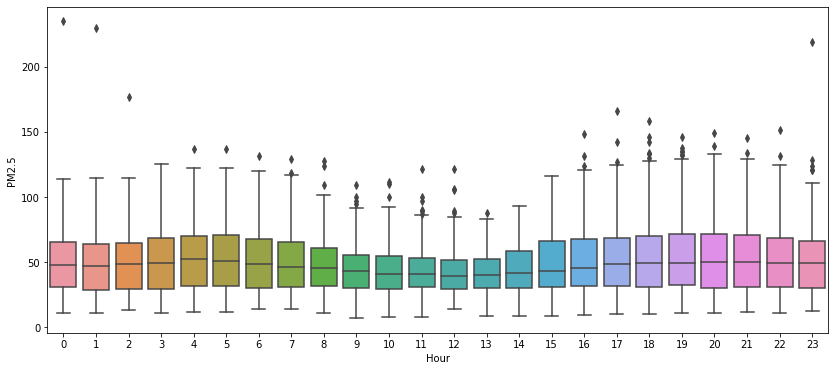

In [ ]:
plt.figure(figsize = (14,6))
sns.boxplot(x = 'Hour', y = df3['PM2.5'], data=df3)
plt.show()

In [ ]:
fig = px.box(df3, x="Hour", y=df3['PM2.5'])
fig.show()

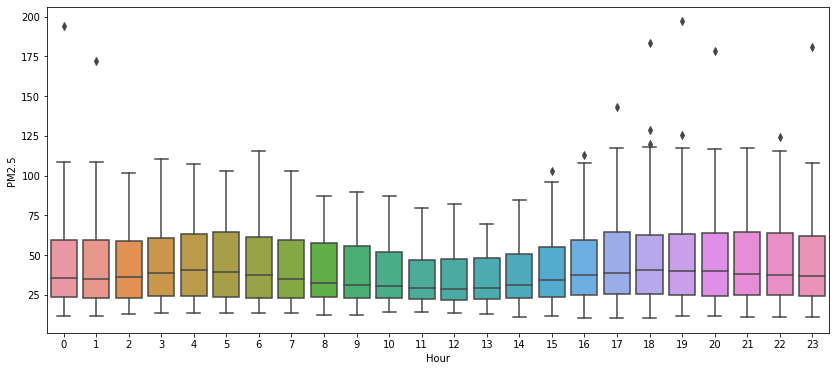

In [ ]:
plt.figure(figsize = (14,6))
sns.boxplot(x = 'Hour', y = df4['PM2.5'], data=df4)
plt.show()

In [ ]:
fig = px.box(df4, x="Hour", y=df4['PM2.5'])
fig.show()

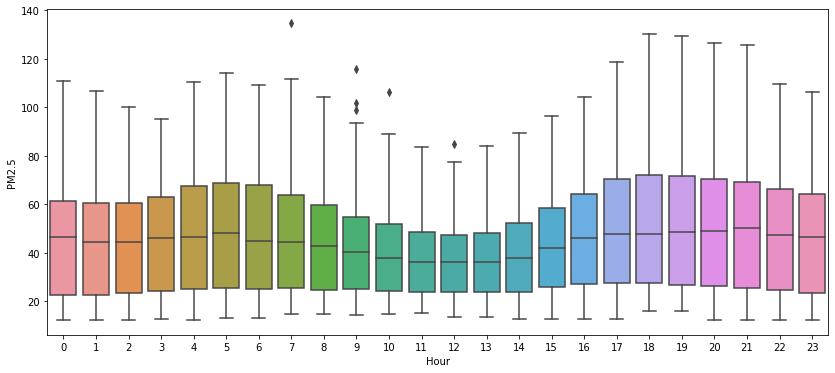

In [ ]:
plt.figure(figsize = (14,6))
sns.boxplot(x = 'Hour', y = df5['PM2.5'], data=df5)
plt.show()

In [ ]:
fig = px.box(df5, x="Hour", y=df5['PM2.5'])
fig.show()

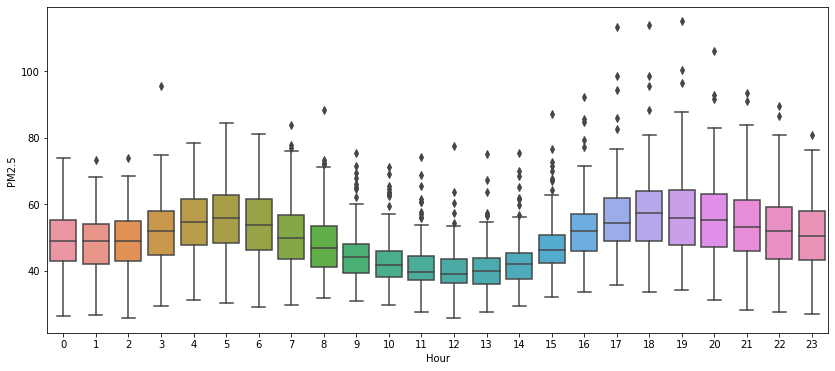

In [ ]:
plt.figure(figsize = (14,6))
sns.boxplot(x = 'Hour', y = df6['PM2.5'], data=df6)
plt.show()

In [ ]:
fig = px.box(df6, x="Hour", y=df6['PM2.5'])
fig.show()

In [ ]:
fig = px.box(df1, x="Day", y=df1['PM2.5'])
fig.show()

In [ ]:
fig = px.box(df2, x="Day", y=df2['PM2.5'])
fig.show()

In [ ]:
fig = px.box(df3, x="Day", y=df3['PM2.5'])
fig.show()

In [ ]:
fig = px.box(df4, x="Day", y=df4['PM2.5'])
fig.show()

In [ ]:
fig = px.box(df5, x="Day", y=df5['PM2.5'])
fig.show()

In [ ]:
fig = px.box(df6, x="Day", y=df6['PM2.5'])
fig.show()

In [ ]:
fig = px.box(df1, x="Month", y=df1['PM2.5'])
fig.show()

In [ ]:
fig = px.box(df2, x="Month", y=df2['PM2.5'])
fig.show()

In [ ]:
fig = px.box(df3, x="Month", y=df3['PM2.5'])
fig.show()

In [ ]:
fig = px.box(df4, x="Month", y=df4['PM2.5'])
fig.show()

In [ ]:
fig = px.box(df5, x="Month", y=df5['PM2.5'])
fig.show()

In [ ]:
fig = px.box(df6, x="Month", y=df6['PM2.5'])
fig.show()

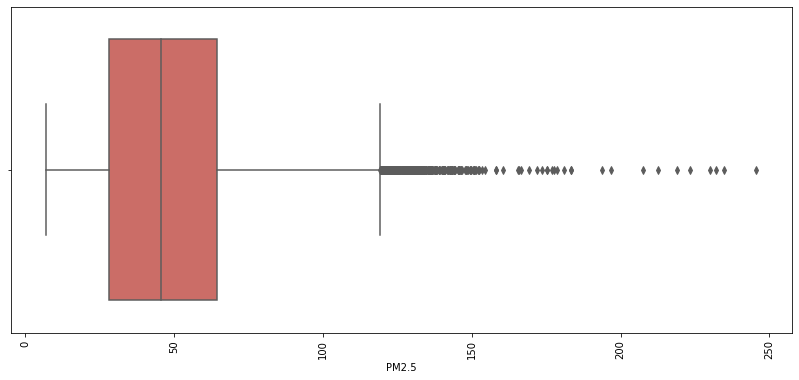

In [ ]:
plt.figure(figsize = (14,6))
sns.boxplot(df_new['PM2.5'],data=df_new, palette = 'hls')
plt.xticks(rotation = 90)
plt.yticks(rotation = 90)
plt.show()

In [ ]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

Year      2.00
Month     7.00
Day      15.00
Hour     12.00
PM2.5    36.44
dtype: float64


In [ ]:
df_new = df_new[~((df_new < (Q1 - 1.5 * IQR))|(df_new > (Q3 + 1.5 * IQR))).any(axis=1)]

In [ ]:
df_new.shape

(35814, 5)

In [ ]:
fig = px.scatter_3d(df_new, x = "Year", y = "Month", z = "PM2.5",
                    color = "PM2.5", color_continuous_scale = ["#00FF00", "#FFC800", "#FF0000", "#B803BF"], 
                    range_color = (-45, 225)) # range of color bar

fig.update_traces(marker = dict(size = 3.5)) # scaling down the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 12))
fig.show()

In [ ]:
fig = px.scatter_3d(df_new, x = "Month", y = "Day", z = "PM2.5",
                    color = "PM2.5", color_continuous_scale = ["#00FF00", "#FFC800", "#FF0000", "#B803BF"], 
                    range_color = (-45, 225)) # range of color bar

fig.update_traces(marker = dict(size = 2.5)) # scaling down the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 12))
fig.show()

In [ ]:
fig = px.scatter_3d(df_new, x = "Month", y = "Day", range_z = [0, 250], z = "PM2.5",
                    color = "PM2.5", color_continuous_scale = ["#00FF00", "#FFC800", "#FF0000", "#B803BF"],
                    animation_frame = "Hour", range_color = (-45, 225)) # range of color bar

fig.update_traces(marker = dict(size = 3.5)) # scaling down the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 12))
fig.show()

In [ ]:
fig = px.scatter_3d(df_new, x = "Day", y = "Hour", z = "PM2.5",
                    color = "PM2.5", color_continuous_scale = ["#00FF00", "#FFC800", "#FF0000", "#B803BF"], 
                    range_color = (-45, 225)) # range of color bar

fig.update_traces(marker = dict(size = 2.5)) # scaling down the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 12))
fig.show()

In [ ]:
fig = px.scatter_3d(df_new, x = "Year", y = "Day", range_z = [0,250], z = "PM2.5",
                    color = "PM2.5", color_continuous_scale = ["#00FF00", "#FFC800", "#FF0000", "#B803BF"],
                    animation_frame = "Hour", range_color = (-45, 225)) # range of color bar

fig.update_traces(marker = dict(size = 3.5)) # scaling down the markers
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 12))
fig.show()

In [ ]:
fig = px.box(df_new, x = "Year", y = "PM2.5", points = "all", color = "Year",
             color_discrete_sequence = px.colors.qualitative.Set3,
             title = "PM2.5 Distribution by Year")

fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 20))

fig.update_traces(marker = dict(size = 0.75)) # scaling down the markers

fig.show()

In [ ]:
fig = px.histogram(df_new, x = "Year", y = "PM2.5", color="Month", hover_data = df_new.columns,
                   color_discrete_sequence = px.colors.qualitative.Set3, 
                   title = "Sum of PM2.5 Distribution by Year and Month" )

fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 15))
fig.show()

In [ ]:
fig = px.box(df_new, x = "Month", y = "PM2.5", points = "all", color = "Month",
             color_discrete_sequence = px.colors.qualitative.Set3,
             title = "PM2.5 Distribution by Month")

fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 20))

fig.update_traces(marker = dict(size = 0.75)) # scaling down the markers

fig.show()

In [ ]:
# Isolate 2018-2021 to view years with data from every month

fig = px.histogram(df_new, x = "Month", y = "PM2.5", color = "Year", hover_data = df_new.columns,
                   color_discrete_sequence = px.colors.qualitative.Set3, 
                   title = "Sum of PM2.5 Distribution by Month and Year" )

fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 15))
fig.show()

In [ ]:
fig = px.density_contour(df_new, x = "Month", y = "PM2.5", title = "PM2.5 Density by Month")

fig.update_layout(yaxis_range = [0, 115])
fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 15))
fig.update_traces(contours_coloring = "fill", contours_showlabels = True)
fig.show()

In [ ]:
# Here I store years 2018-2021 in a df because 2017 and 2022 does not have data from every month
df1 = df_new[df_new["Year"] > 2017]
df2 = df1[df1["Year"] < 2022]

# Then loop through every month in years 2018-2021
for i in range(1, 13):
    
    df0 = df2[df2["Month"] == i]

    fig = px.histogram(df0, x = "Day", y = "PM2.5", color="Year", hover_data = df_new.columns,
                       color_discrete_sequence = px.colors.qualitative.Pastel, 
                       title = f"Daily Sum of PM2.5 in Month: {i}/--/2018-2021")
    
    fig.update_layout(yaxis_range = [0, 11000])
    fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 20))

    fig.show()

In [ ]:
# Looping through all years in dataset - 2017 and 2022 does not have data for every month
for i in range(2017, 2023):
    
    df0 = df_new[df_new["Year"] == i]

    fig = px.histogram(df0, x = "Hour", y = "PM2.5", color="Month", hover_data = df_new.columns,
                       color_discrete_sequence = px.colors.qualitative.Set3, 
                       title = f"Total Sum of PM2.5 in Year: {i} by Hour")
    
    fig.update_layout(yaxis_range = [0, 21000])
    fig.update_layout(template = "plotly_dark", font = dict(family = "PT Sans", size = 20))

    fig.show()

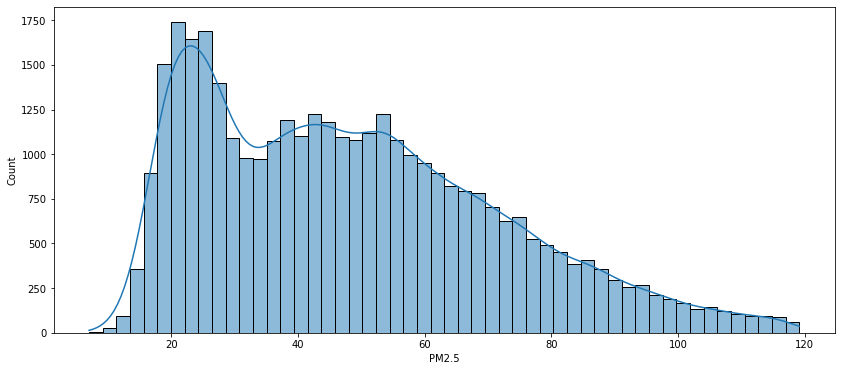

In [ ]:
plt.figure(figsize = (14,6))
sns.histplot(df_new['PM2.5'], kde = True, palette = 'hls')
plt.show()

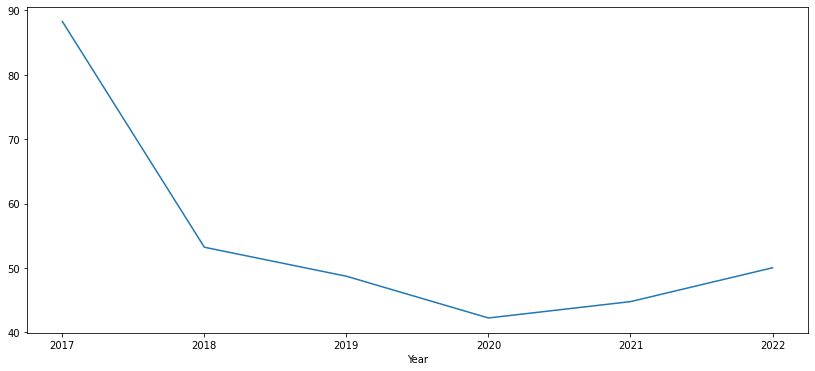

In [ ]:
plt.figure(figsize = (14,6))
df_new.groupby('Year')['PM2.5'].mean().plot()
plt.show()

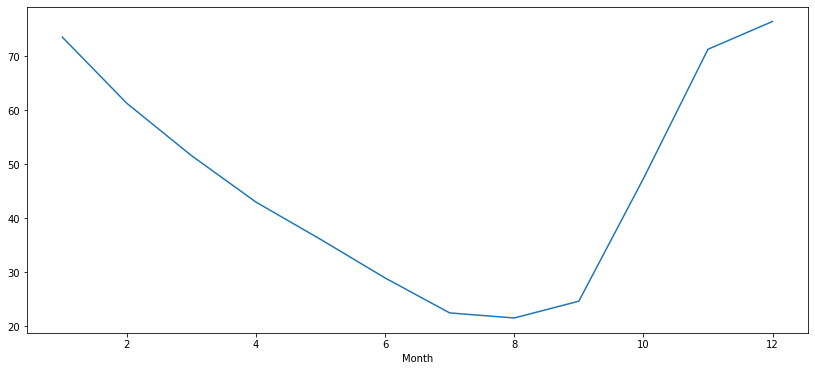

In [ ]:
plt.figure(figsize = (14,6))
df_new.groupby('Month')['PM2.5'].mean().plot()
plt.show()

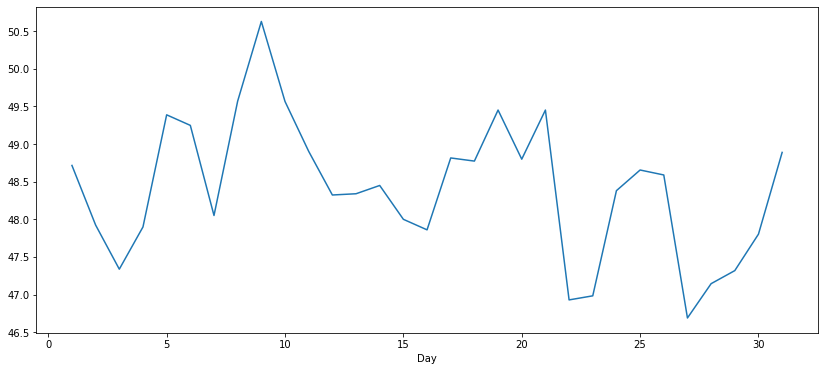

In [ ]:
plt.figure(figsize = (14,6))
df_new.groupby('Day')['PM2.5'].mean().plot()
plt.show()

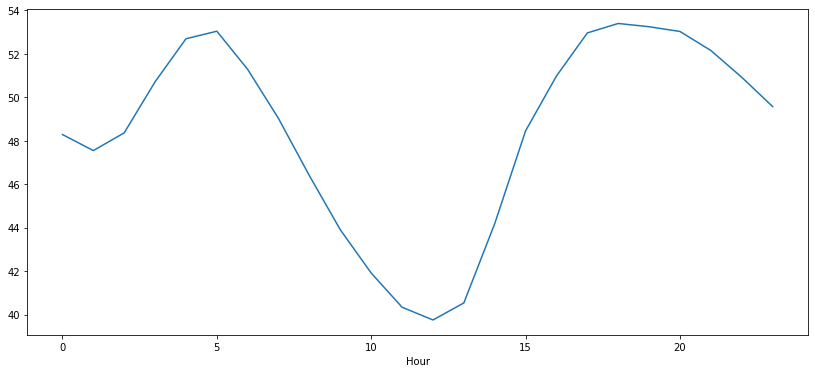

In [ ]:
plt.figure(figsize = (14,6))
df_new.groupby('Hour')['PM2.5'].mean().plot()
plt.show()

In [ ]:
df_new = df_new.reset_index()

In [ ]:
df_new['Date']=df_new["Timestamp"].dt.date

In [ ]:
df_date=pd.DataFrame(df_new.groupby('Date')['PM2.5'].mean())
df_date

,PM2.5
Date,
2017-01-12,93.488095
2017-02-12,89.929474
2017-03-12,93.410000
2017-04-12,97.727059
2017-05-12,95.460000
...,...
2022-11-05,36.367917
2022-12-01,47.640417
2022-12-02,51.887500


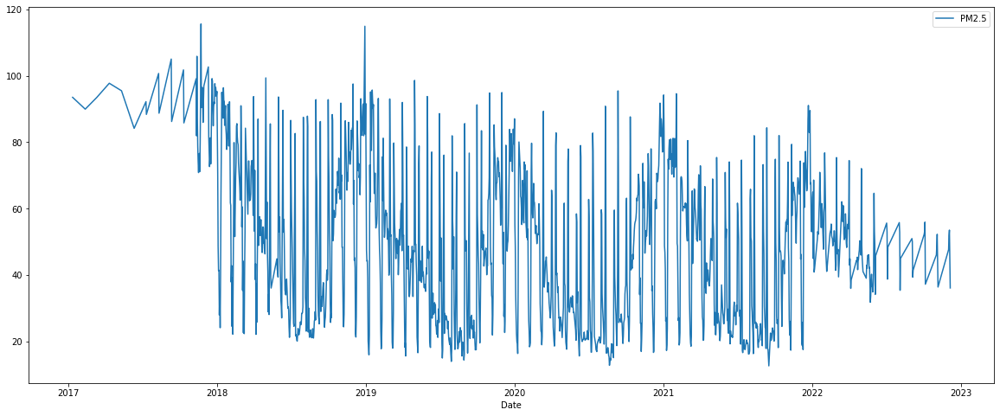

In [ ]:
df_date.plot(figsize=(20,8))
plt.show()

In [ ]:
import math

In [ ]:
df_date.values

array([[93.48809524],
       [89.92947368],
       [93.41      ],
       ...,
       [51.8875    ],
       [53.52166667],
       [36.09541667]])

In [ ]:
dataset  = df_date.values
training_data_len = math.ceil(len(dataset)*.8)
training_data_len

1293

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM

![image.png](attachment:image.png)

![image.png](attachment:image.png)

In [ ]:
sc = MinMaxScaler(feature_range=(0,1))
scaled_data = sc.fit_transform(dataset)
scaled_data

array([[0.78539941],
       [0.75083098],
       [0.78464079],
       ...,
       [0.38129154],
       [0.39716583],
       [0.22788737]])

In [ ]:
train_data = scaled_data[0:training_data_len, :]
x_train = []
y_train = []
num = 60
for i in range(num, len(train_data)):
    x_train.append(train_data[i-num:i , 0])
    y_train.append(train_data[i , 0])

In [ ]:
x_train, y_train = np.array(x_train), np.array(y_train)
x_train = np.reshape(x_train, (x_train.shape[0],x_train.shape[1],1))
x_train.shape

(1233, 60, 1)

In [ ]:
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(x_train.shape[1],1)))
model.add(LSTM(50, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

In [ ]:
model.compile(optimizer = "adam", loss = "mean_squared_error")

In [ ]:
model.fit(x_train,y_train, batch_size=1, epochs=1)

1233/1233 [==============================] - 39s 29ms/step - loss: 0.0303


In [ ]:
test_data = scaled_data[training_data_len-60: , :]
x_test = []
y_test = dataset[training_data_len:,:]
for i in range(num, len(test_data)):
      x_test.append(test_data[i-num:i, 0])

In [ ]:
x_test = np.array(x_test)
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

In [ ]:
predictions = model.predict(x_test)
predictions = sc.inverse_transform(predictions)

11/11 [==============================] - 1s 16ms/step


In [ ]:
rmse = np.sqrt(np.mean(predictions - y_test)**2)
rmse

4.616652081117722

In [ ]:
train = df_date[:training_data_len]
valid = df_date[training_data_len:]
valid["Predictions"] = predictions
valid

,PM2.5,Predictions
Date,,
2021-06-28,28.667917,34.309296
2021-06-29,30.903750,35.646595
2021-06-30,29.017917,37.245541
2021-07-01,61.623333,36.631577
2021-07-02,58.867500,54.985462
...,...,...
2022-11-05,36.367917,54.862080
2022-12-01,47.640417,45.278122
2022-12-02,51.887500,50.506084


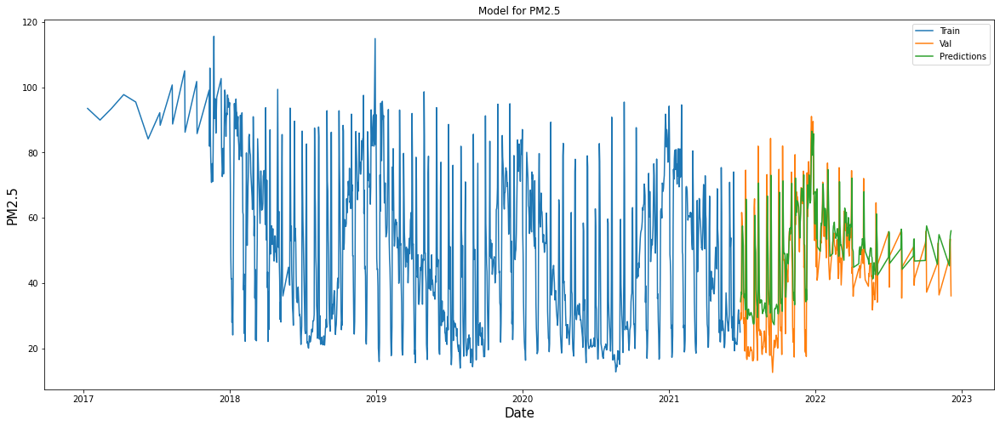

In [ ]:
plt.figure(figsize=(20,8))
plt.title("Model for PM2.5")
plt.xlabel("Date", fontsize = 15)
plt.ylabel("PM2.5",fontsize=15)
plt.plot(train[df_date.columns])
plt.plot(valid['PM2.5'])
plt.plot(valid["Predictions"])
plt.legend(["Train","Val","Predictions"])
plt.show()

In [ ]:
!pip install SCALECAST
from scalecast.Forecaster import Forecaster

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 680.3/680.3 KB 11.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 KB 17.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.1/133.1 KB 13.4 MB/s eta 0:00:00
  Created wheel for SCALECAST: filename=SCALECAST-0.15.12-py3-none-any.whl size=110092 sha256=59b1f32238d30774a00e38c09231b7bb5961af99f8995cdbb2a669dc7703358c
  Stored in directory: /root/.cache/pip/wheels/a4/88/cd/5ad159f36ef3de3396bcce0f0ebf7f0fab3f0b5b0d2e427317
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107748 sha256=b7be0618548179efc68bb8db636a232cbc968f1ff3ee183698bd12e49c08439b
  Stored in directory: /root/.cache/pip/wheels/85/ac/25/ffcd87ef8f9b1eec324fdf339359be71f22612459d8c75d89c
Successfully built SCALECAST eli5
  Attempting unin

In [ ]:
f = Forecaster(y=df_new['PM2.5'], current_dates=df_new['Date'])

In [ ]:
f

Forecaster(
    DateStartActuals=2017-07-11T00:00:00.000000000
    DateEndActuals=2022-04-06T00:00:00.000000000
    Freq=None
    N_actuals=35814
    ForecastLength=0
    Xvars=[]
    Differenced=0
    TestLength=1
    ValidationLength=1
    ValidationMetric=rmse
    ForecastsEvaluated=[]
    CILevel=0.95
    BootstrapSamples=100
    CurrentEstimator=None
    GridsFile=Grids
)

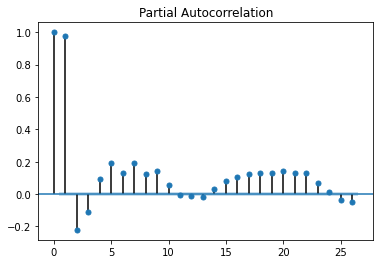

In [ ]:
f.plot_pacf(lags=26)
plt.show()

In [ ]:
stat, pval, _, _, _, _ = f.adf_test(full_res=True)

In [ ]:
stat

-4.9031806150286465

In [ ]:
pval

3.4380606566318826e-05

In [ ]:
f.set_test_length(12)       # 1. 12 observations to test the results
f.generate_future_dates(12) # 2. 12 future points to forecast
f.set_estimator('lstm')     # 3. LSTM neural network

1119/1119 [==============================] - 2s 2ms/step


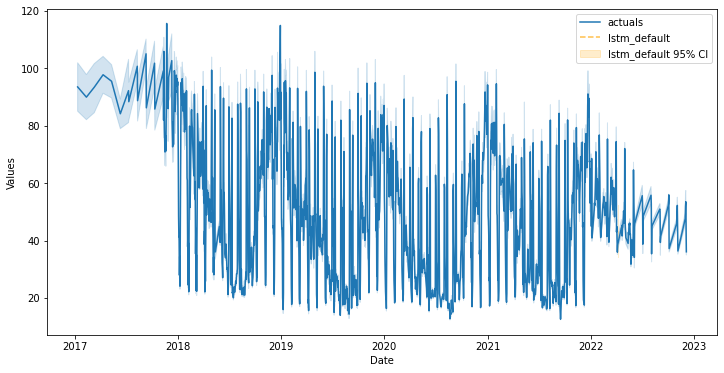

In [ ]:
f.manual_forecast(call_me='lstm_default')
f.plot_test_set(ci=True)

1119/1119 [==============================] - 4s 4ms/step


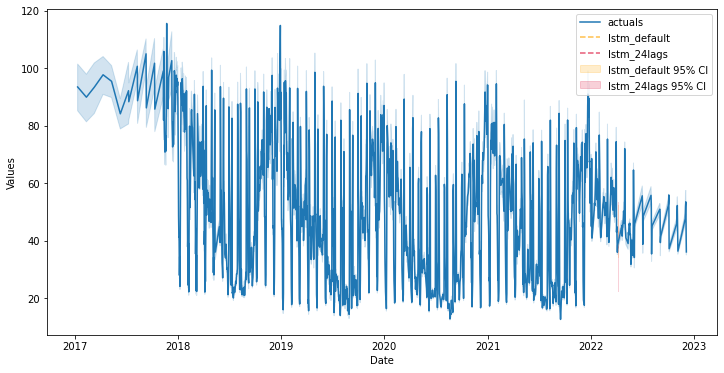

In [ ]:
f.manual_forecast(call_me='lstm_24lags',lags=24)
f.plot_test_set(ci=True)

Epoch 1/5
895/895 [==============================] - 15s 14ms/step - loss: 0.0810 - val_loss: 0.0681
Epoch 2/5
895/895 [==============================] - 12s 13ms/step - loss: 0.0578 - val_loss: 0.0668
Epoch 3/5
895/895 [==============================] - 12s 13ms/step - loss: 0.0568 - val_loss: 0.0658
Epoch 4/5
895/895 [==============================] - 12s 13ms/step - loss: 0.0560 - val_loss: 0.0649
Epoch 5/5
1/1 [==============================] - 1s 506ms/step
Epoch 1/5
895/895 [==============================] - 15s 14ms/step - loss: 0.0798 - val_loss: 0.0682
Epoch 2/5
895/895 [==============================] - 11s 12ms/step - loss: 0.0578 - val_loss: 0.0670
Epoch 3/5
895/895 [==============================] - 11s 13ms/step - loss: 0.0571 - val_loss: 0.0668
Epoch 4/5
895/895 [==============================] - 11s 13ms/step - loss: 0.0563 - val_loss: 0.0658
Epoch 5/5
1119/1119 [==============================] - 4s 4ms/step


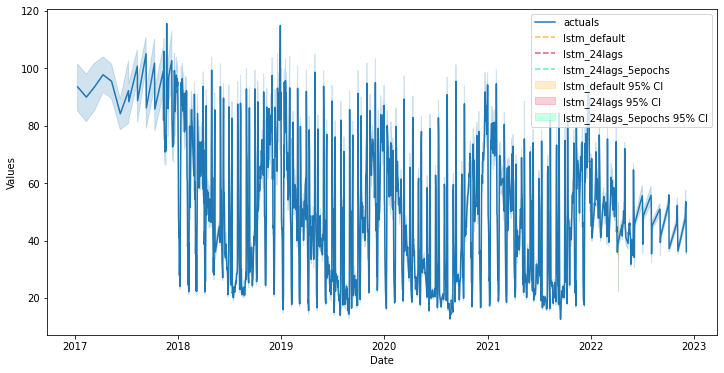

In [ ]:
f.manual_forecast(call_me='lstm_24lags_5epochs',
                  lags=24,
                  epochs=5,
                  validation_split=.2,
                  shuffle=True)
f.plot_test_set(ci=True)

Epoch 1/25
895/895 [==============================] - 40s 37ms/step - loss: 0.0667 - val_loss: 0.0667
Epoch 2/25
895/895 [==============================] - 31s 35ms/step - loss: 0.0561 - val_loss: 0.0657
Epoch 3/25
895/895 [==============================] - 31s 34ms/step - loss: 0.0514 - val_loss: 0.0644
Epoch 4/25
895/895 [==============================] - 32s 36ms/step - loss: 0.0489 - val_loss: 0.0637
Epoch 5/25
895/895 [==============================] - 30s 34ms/step - loss: 0.0469 - val_loss: 0.0649
Epoch 6/25
895/895 [==============================] - 30s 34ms/step - loss: 0.0453 - val_loss: 0.0606
Epoch 7/25
895/895 [==============================] - 31s 34ms/step - loss: 0.0441 - val_loss: 0.0609
Epoch 8/25
895/895 [==============================] - 31s 34ms/step - loss: 0.0429 - val_loss: 0.0573
Epoch 9/25
895/895 [==============================] - 31s 35ms/step - loss: 0.0418 - val_loss: 0.0561
Epoch 10/25
895/895 [==============================] - 30s 34ms/step - loss: 0.041

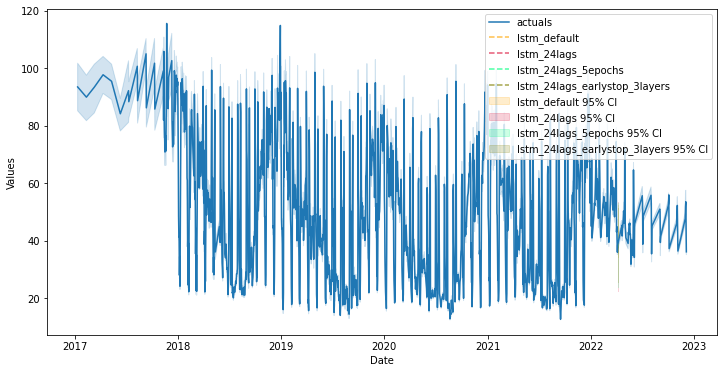

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
f.manual_forecast(call_me='lstm_24lags_earlystop_3layers',
                  lags=24,
                  epochs=25,
                  validation_split=.2,
                  shuffle=True,
                  callbacks=EarlyStopping(monitor='val_loss',
                                          patience=5),
                  lstm_layer_sizes=(16,16,16),
                  dropout=(0,0,0))
f.plot_test_set(ci=True)

Epoch 1/15
894/894 [==============================] - 110s 114ms/step - loss: 0.0590 - val_loss: 0.0626
Epoch 2/15
894/894 [==============================] - 96s 108ms/step - loss: 0.0447 - val_loss: 0.0574
Epoch 3/15
894/894 [==============================] - 98s 109ms/step - loss: 0.0418 - val_loss: 0.0559
Epoch 4/15
894/894 [==============================] - 98s 110ms/step - loss: 0.0405 - val_loss: 0.0549
Epoch 5/15
894/894 [==============================] - 97s 109ms/step - loss: 0.0393 - val_loss: 0.0531
Epoch 6/15
894/894 [==============================] - 96s 107ms/step - loss: 0.0388 - val_loss: 0.0534
Epoch 7/15
894/894 [==============================] - 94s 105ms/step - loss: 0.0385 - val_loss: 0.0536
Epoch 8/15
894/894 [==============================] - 96s 108ms/step - loss: 0.0383 - val_loss: 0.0520
Epoch 9/15
894/894 [==============================] - 95s 106ms/step - loss: 0.0380 - val_loss: 0.0521
Epoch 10/15
894/894 [==============================] - 98s 110ms/step - 

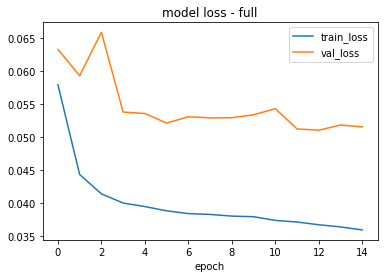

1118/1118 [==============================] - 37s 33ms/step


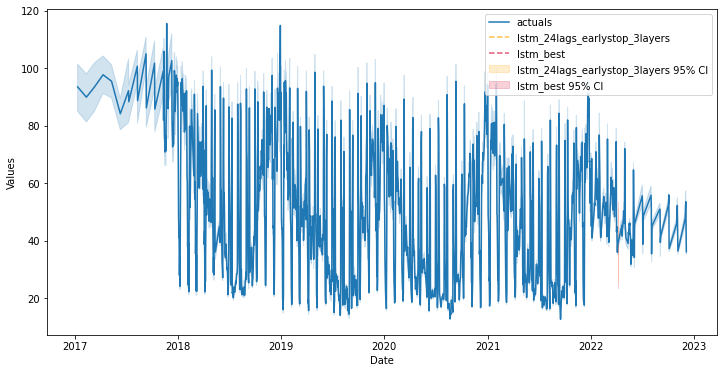

In [ ]:
f.manual_forecast(call_me='lstm_best',
                  lags=36,
                  batch_size=32,
                  epochs=15,
                  validation_split=.2,
                  shuffle=True,
                  activation='tanh',
                  optimizer='Adam',
                  learning_rate=0.001,
                  lstm_layer_sizes=(72,)*4,
                  dropout=(0,)*4,
                  plot_loss=True)
f.plot_test_set(order_by='LevelTestSetMAPE',models='top_2',ci=True)

In [ ]:
f.set_estimator('mlr') # 1. choose the mlr estimator
f.add_ar_terms(24) # 2. add regressors (24 lagged terms)
f.add_seasonal_regressors('month','quarter',dummy=True) # 2.
f.add_seasonal_regressors('year') # 2.
f.add_time_trend() # 2.
f.diff() # 3. difference non-stationary data

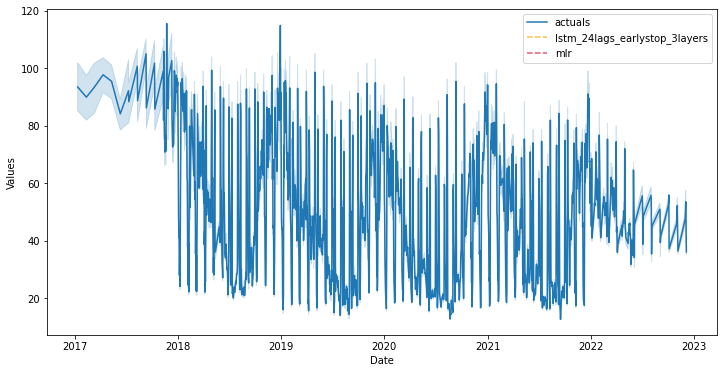

In [ ]:
f.manual_forecast()
f.plot_test_set(order_by='LevelTestSetMAPE',models='top_2')

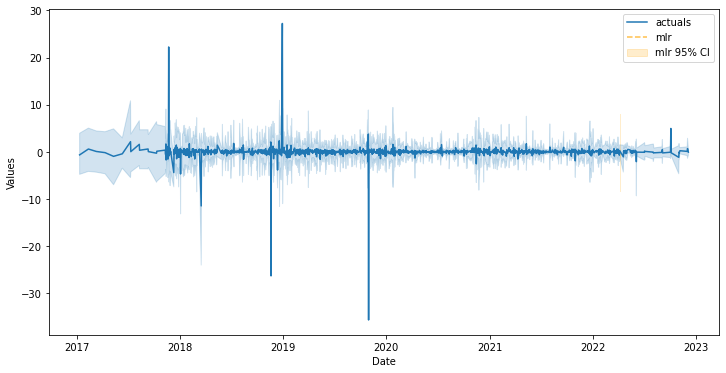

In [ ]:
f.plot_test_set(models='mlr',ci=True)

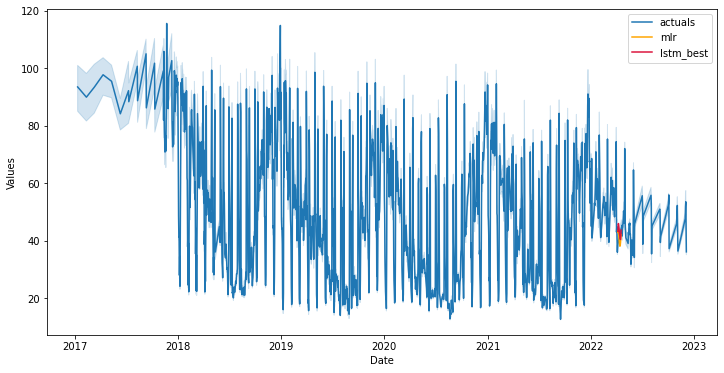

In [ ]:
f.plot(models=['mlr','lstm_best'],
       order_by='LevelTestSetMAPE',
       level=True)

In [ ]:
f.export('model_summaries',determine_best_by='LevelTestSetMAPE')[
    ['ModelNickname',
     'LevelTestSetMAPE',
     'LevelTestSetRMSE',
     'LevelTestSetR2',
     'best_model']
]

,ModelNickname,LevelTestSetMAPE,LevelTestSetRMSE,LevelTestSetR2,best_model
0,lstm_24lags_earlystop_3layers,0.032356,1.505273,0.847863,True
1,mlr,0.042686,2.031015,0.723032,False
2,lstm_best,0.047717,2.086111,0.707801,False
3,lstm_24lags_5epochs,0.078639,3.422331,0.213593,False
4,lstm_24lags,0.090571,3.936675,-0.040549,False
5,lstm_default,0.148898,6.134733,-1.526939,False
